**Step 1: Mount/ Download the Dataset from Roboflow**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="sU9eB2AmwzwynSFkqVaS")
project = rf.workspace("eyantra-twpmn").project("license-plate-detection-g15hx")
version = project.version(1)
dataset = version.download("coco")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.7 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to license-plate-detection-1 in coco:: 100%|██████████| 5411/5411 [00:02<00:00, 2508.84it/s]


**Step 2: Install Necessary Libraries**

In [ ]:
# !python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Cloning into 'detectron2'...
remote: Enumerating objects: 15737, done.
remote: Counting objects: 100% (460/460), done.
remote: Compressing objects: 100% (339/339), done.
remote: Total 15737 (delta 211), reused 305 (delta 112), pack-reused 15277
Receiving objects: 100% (15737/15737), 6.52 MiB | 23.75 MiB/s, done.
Resolving deltas: 100% (11327/11327), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 64.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 16.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61400 sha256=50cf6cf1be2a23887f5a3dcc49282ec080113e3b1d37d7897004cd7cb

**Step 3: check installations**

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.3 ; cuda:  cu121
detectron2: 0.6


**Step 4: Register the Dataset with Detectron2**

In [ ]:
import os
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, DatasetCatalog

# Define paths to your dataset in Google Drive
base_path = '/content/license-plate-detection-1/'
train_path = os.path.join(base_path, 'train')
val_path = os.path.join(base_path, 'valid')
test_path = os.path.join(base_path, 'test')

train_annotations = os.path.join(train_path, '/content/license-plate-detection-1/train/_annotations.coco.json')
val_annotations = os.path.join(val_path, '/content/license-plate-detection-1/valid/_annotations.coco.json')
test_annotations = os.path.join(test_path, '/content/license-plate-detection-1/test/_annotations.coco.json')

# Register the COCO datasets
register_coco_instances("lp_train", {}, train_annotations, train_path)
register_coco_instances("lp_val", {}, val_annotations, val_path)
register_coco_instances("lp_test", {}, test_annotations, test_path)

lp_train_metadata = MetadataCatalog.get("lp_train")
lp_train_dataset = DatasetCatalog.get("lp_train")

lp_val_metadata = MetadataCatalog.get("lp_val")
lp_val_dataset = DatasetCatalog.get("lp_val")

lp_test_metadata = MetadataCatalog.get("lp_test")
lp_test_dataset = DatasetCatalog.get("lp_test")


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



**Step 5: Configure and Train the Model**

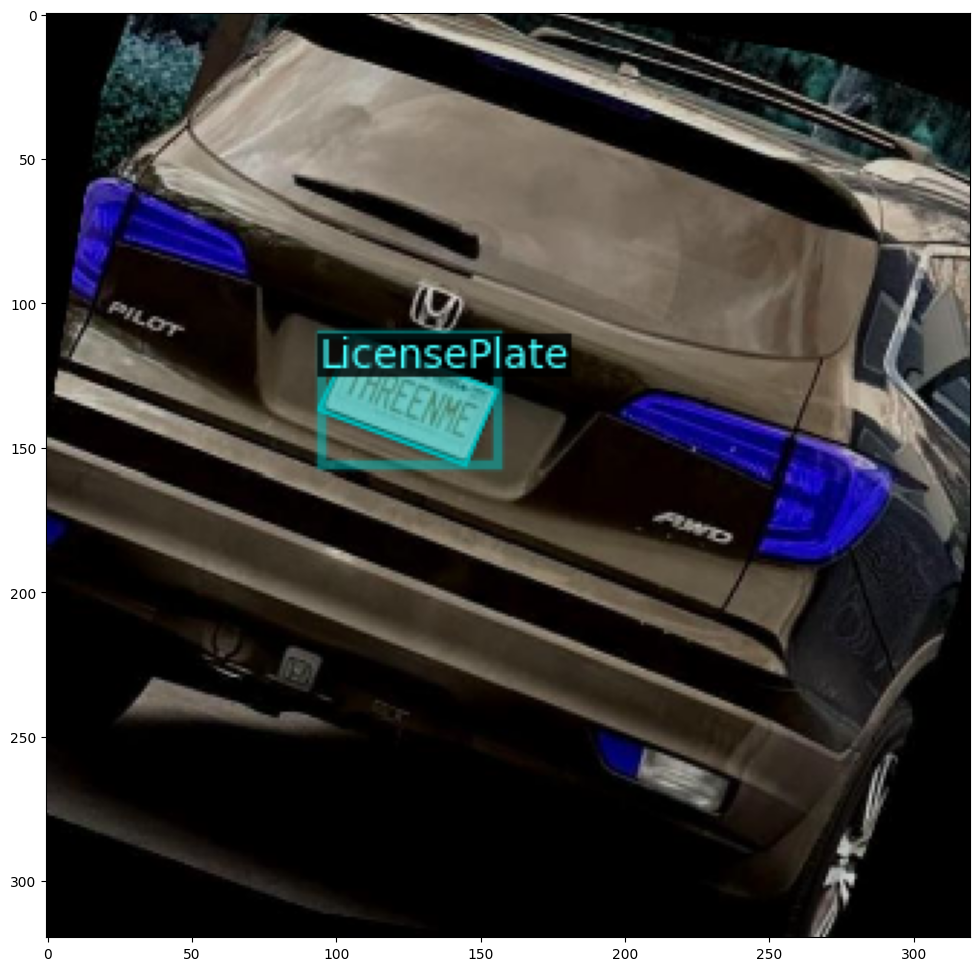

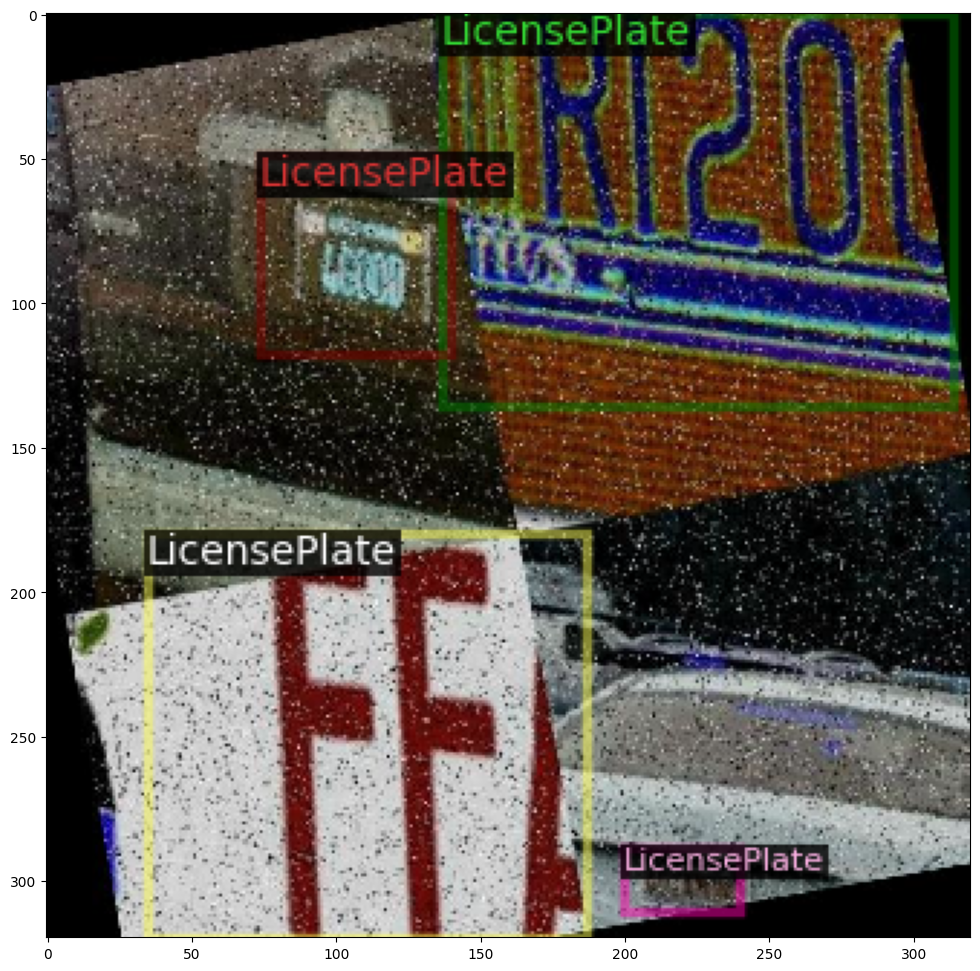

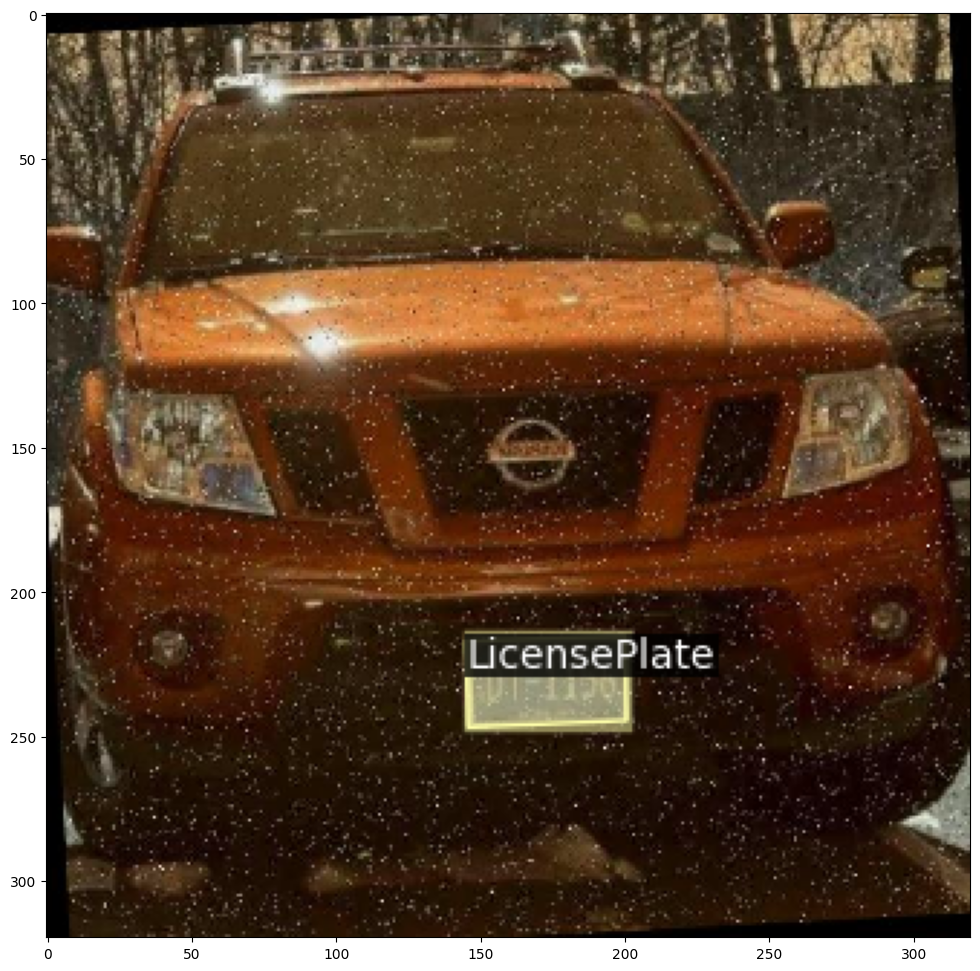

[07/01 21:06:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 93.3MB/s]                          
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[07/01 21:06:21 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)


[07/01 21:06:33 d2.utils.events]:  eta: 0:00:24  iter: 19  total_loss: 1.444  loss_cls: 0.9894  loss_box_reg: 0.3704  loss_rpn_cls: 0.03817  loss_rpn_loc: 0.007517    time: 0.3068  last_time: 0.2752  data_time: 0.0273  last_data_time: 0.0115   lr: 4.7703e-05  max_mem: 1737M
[07/01 21:06:41 d2.utils.events]:  eta: 0:00:17  iter: 39  total_loss: 0.8877  loss_cls: 0.453  loss_box_reg: 0.3641  loss_rpn_cls: 0.01548  loss_rpn_loc: 0.005967    time: 0.2928  last_time: 0.3146  data_time: 0.0082  last_data_time: 0.0061   lr: 9.7653e-05  max_mem: 1737M
[07/01 21:06:47 d2.utils.events]:  eta: 0:00:11  iter: 59  total_loss: 0.6408  loss_cls: 0.2753  loss_box_reg: 0.341  loss_rpn_cls: 0.02013  loss_rpn_loc: 0.006518    time: 0.2936  last_time: 0.3160  data_time: 0.0169  last_data_time: 0.0056   lr: 0.0001476  max_mem: 1737M
[07/01 21:06:53 d2.utils.events]:  eta: 0:00:05  iter: 79  total_loss: 0.5929  loss_cls: 0.2293  loss_box_reg: 0.3583  loss_rpn_cls: 0.01663  loss_rpn_loc: 0.004188    time: 0.

In [ ]:
import random
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

dataset_dicts = lp_train_dataset

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=lp_train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(12, 12))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("lp_train",)
cfg.DATASETS.TEST = ("lp_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 100    # adjust up if you want to train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  # faster (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(lp_train_metadata.thing_classes)  # number of classes (1 for license plate)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


for 1000 epochs

In [ ]:
# import random
# import cv2
# import matplotlib.pyplot as plt
# from detectron2.utils.visualizer import Visualizer

# dataset_dicts = lp_train_dataset

# for d in random.sample(dataset_dicts, 3):
#     img = cv2.imread(d["file_name"])
#     visualizer = Visualizer(img[:, :, ::-1], metadata=lp_train_metadata, scale=0.5)
#     out = visualizer.draw_dataset_dict(e)
#     plt.figure(figsize=(12, 12))
#     plt.imshow(out.get_image()[:, :, ::-1])
#     plt.show()

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("lp_train",)
cfg.DATASETS.TEST = ("lp_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # adjust up if you want to train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  # faster (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(lp_train_metadata.thing_classes)  # number of classes (1 for license plate)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()



[07/02 18:17:32 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:00, 211MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[07/02 18:17:33 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)


[07/02 18:17:44 d2.utils.events]:  eta: 0:04:29  iter: 19  total_loss: 1.395  loss_cls: 1.08  loss_box_reg: 0.2277  loss_rpn_cls: 0.03277  loss_rpn_loc: 0.006578    time: 0.2704  last_time: 0.2781  data_time: 0.0174  last_data_time: 0.0053   lr: 4.9953e-06  max_mem: 1633M
[07/02 18:17:53 d2.utils.events]:  eta: 0:04:28  iter: 39  total_loss: 1.313  loss_cls: 0.9813  loss_box_reg: 0.279  loss_rpn_cls: 0.02852  loss_rpn_loc: 0.008365    time: 0.2841  last_time: 0.3091  data_time: 0.0123  last_data_time: 0.0059   lr: 9.9902e-06  max_mem: 1737M
[07/02 18:17:58 d2.utils.events]:  eta: 0:04:23  iter: 59  total_loss: 1.13  loss_cls: 0.792  loss_box_reg: 0.2816  loss_rpn_cls: 0.03247  loss_rpn_loc: 0.00557    time: 0.2834  last_time: 0.2714  data_time: 0.0080  last_data_time: 0.0120   lr: 1.4985e-05  max_mem: 1737M
[07/02 18:18:04 d2.utils.events]:  eta: 0:04:20  iter: 79  total_loss: 0.9662  loss_cls: 0.6224  loss_box_reg: 0.2902  loss_rpn_cls: 0.02421  loss_rpn_loc: 0.006753    time: 0.2867 

**Visualiztion in tensorboard**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

**Step 5: Evaluate the Model**

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Evaluate on validation set
evaluator = COCOEvaluator("lp_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "lp_val")
validation_results = inference_on_dataset(trainer.model, val_loader, evaluator)
print(validation_results)

# Evaluate on test set
evaluator = COCOEvaluator("lp_test", cfg, False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "lp_test")
test_results = inference_on_dataset(trainer.model, test_loader, evaluator)
print(test_results)


[07/02 18:23:13 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/02 18:23:13 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [07/02 18:23:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/02 18:23:13 d2.data.datasets.coco]: Loaded 220 images in COCO format from /content/license-plate-detection-1/valid/_annotations.coco.json
[07/02 18:23:14 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/02 18:23:14 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/02 18:23:14 d2.data.common]: Serializing 220 elements to byte tensors and concatenating them all ...
[07/02 18:23:14 d2.data.common]: Se

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[07/02 18:23:15 d2.evaluation.evaluator]: Inference done 11/220. Dataloading: 0.0016 s/iter. Inference: 0.0768 s/iter. Eval: 0.0003 s/iter. Total: 0.0787 s/iter. ETA=0:00:16
[07/02 18:23:20 d2.evaluation.evaluator]: Inference done 72/220. Dataloading: 0.0037 s/iter. Inference: 0.0777 s/iter. Eval: 0.0003 s/iter. Total: 0.0819 s/iter. ETA=0:00:12
[07/02 18:23:25 d2.evaluation.evaluator]: Inference done 133/220. Dataloading: 0.0040 s/iter. Inference: 0.0778 s/iter. Eval: 0.0003 s/iter. Total: 0.0823 s/iter. ETA=0:00:07
[07/02 18:23:30 d2.evaluation.evaluator]: Inference done 195/220. Dataloading: 0.0033 s/iter. Inference: 0.0782 s/iter. Eval: 0.0003 s/iter. Total: 0.0818 s/iter. ETA=0:00:02
[07/02 18:23:32 d2.evaluation.evaluator]: Total inference time: 0:00:17.619125 (0.081949 s / iter per device, on 1 devices)
[07/02 18:23:32 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:16 (0.078205 s / iter per device, on 1 devices)
[07/02 18:23:32 d2.evaluation.coco_evaluation]: 

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[07/02 18:23:35 d2.evaluation.evaluator]: Inference done 25/221. Dataloading: 0.0064 s/iter. Inference: 0.0833 s/iter. Eval: 0.0004 s/iter. Total: 0.0901 s/iter. ETA=0:00:17
[07/02 18:23:40 d2.evaluation.evaluator]: Inference done 85/221. Dataloading: 0.0041 s/iter. Inference: 0.0807 s/iter. Eval: 0.0003 s/iter. Total: 0.0853 s/iter. ETA=0:00:11
[07/02 18:23:45 d2.evaluation.evaluator]: Inference done 147/221. Dataloading: 0.0032 s/iter. Inference: 0.0798 s/iter. Eval: 0.0003 s/iter. Total: 0.0834 s/iter. ETA=0:00:06
[07/02 18:23:50 d2.evaluation.evaluator]: Inference done 205/221. Dataloading: 0.0039 s/iter. Inference: 0.0801 s/iter. Eval: 0.0003 s/iter. Total: 0.0844 s/iter. ETA=0:00:01


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


[07/02 18:23:51 d2.evaluation.evaluator]: Total inference time: 0:00:18.398852 (0.085180 s / iter per device, on 1 devices)
[07/02 18:23:51 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:17 (0.080246 s / iter per device, on 1 devices)
[07/02 18:23:51 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[07/02 18:23:51 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[07/02 18:23:51 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.30s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.617
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.902
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.731
 Average

**Step 6: Make Predictions on Test Images**

In [ ]:
from detectron2.utils.visualizer import ColorMode
from detectron2.engine.defaults import DefaultPredictor

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)

[07/02 18:23:53 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


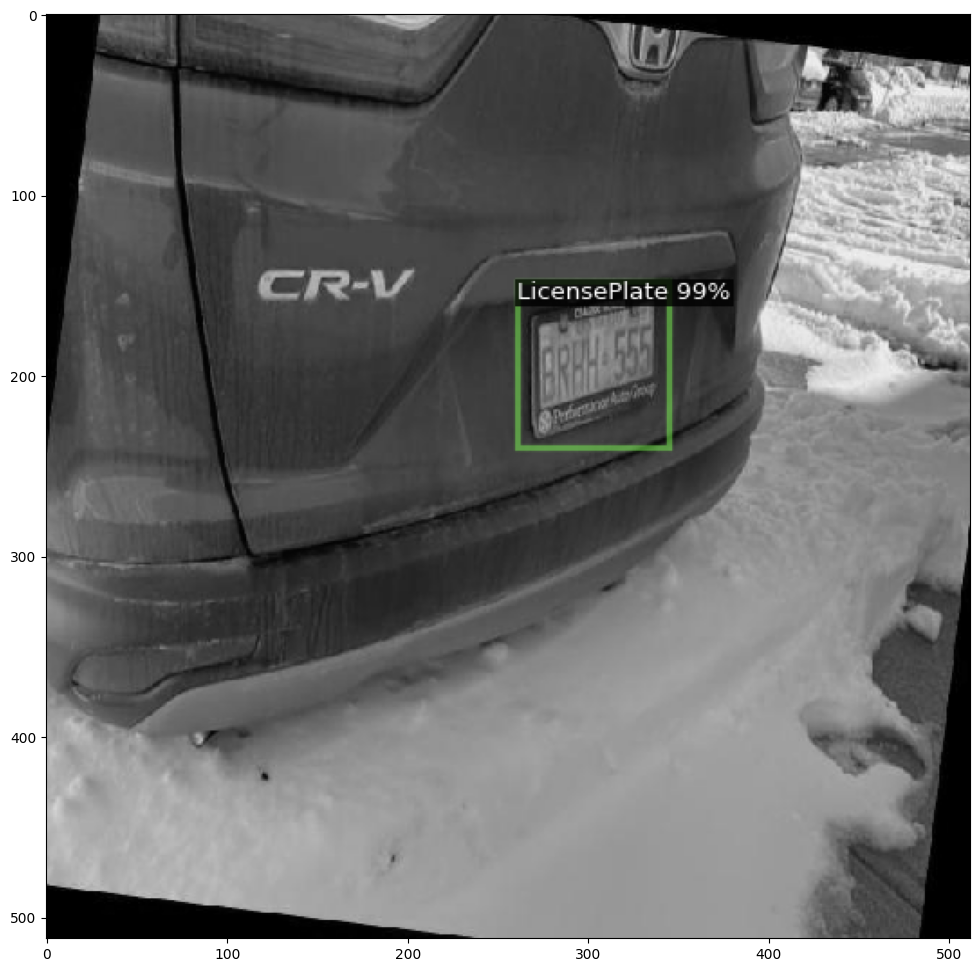

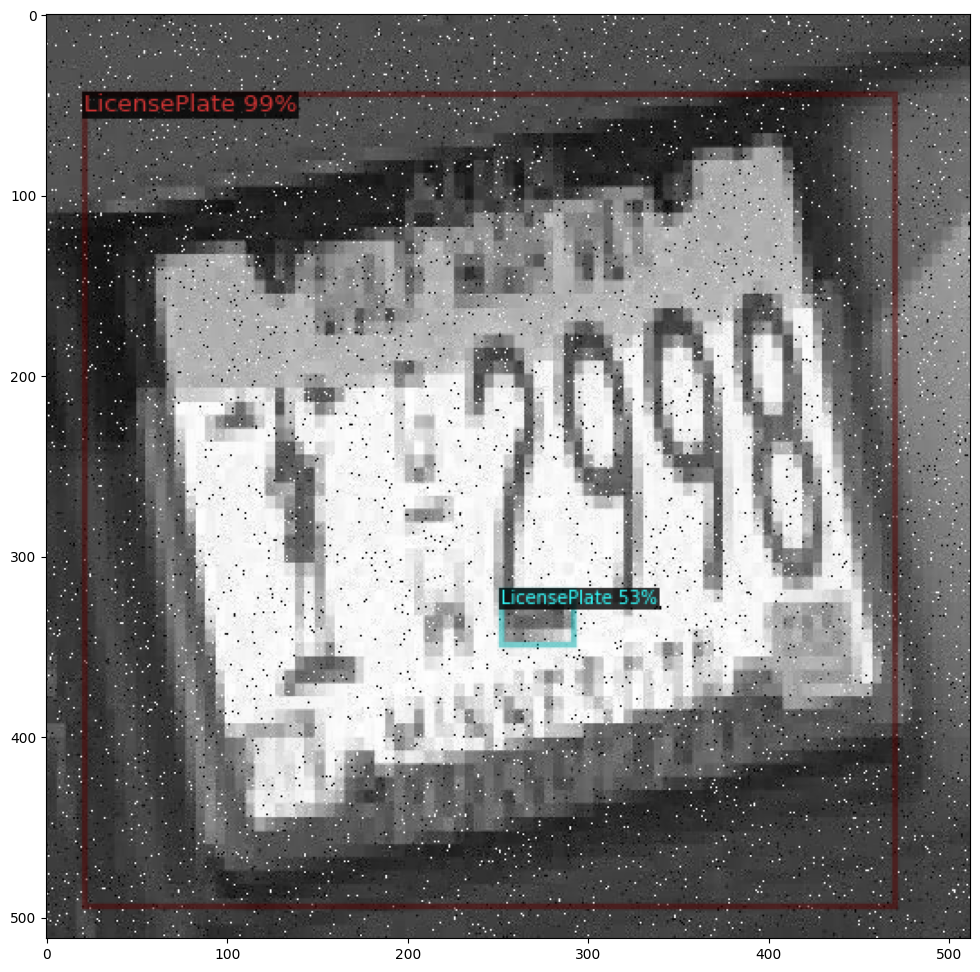

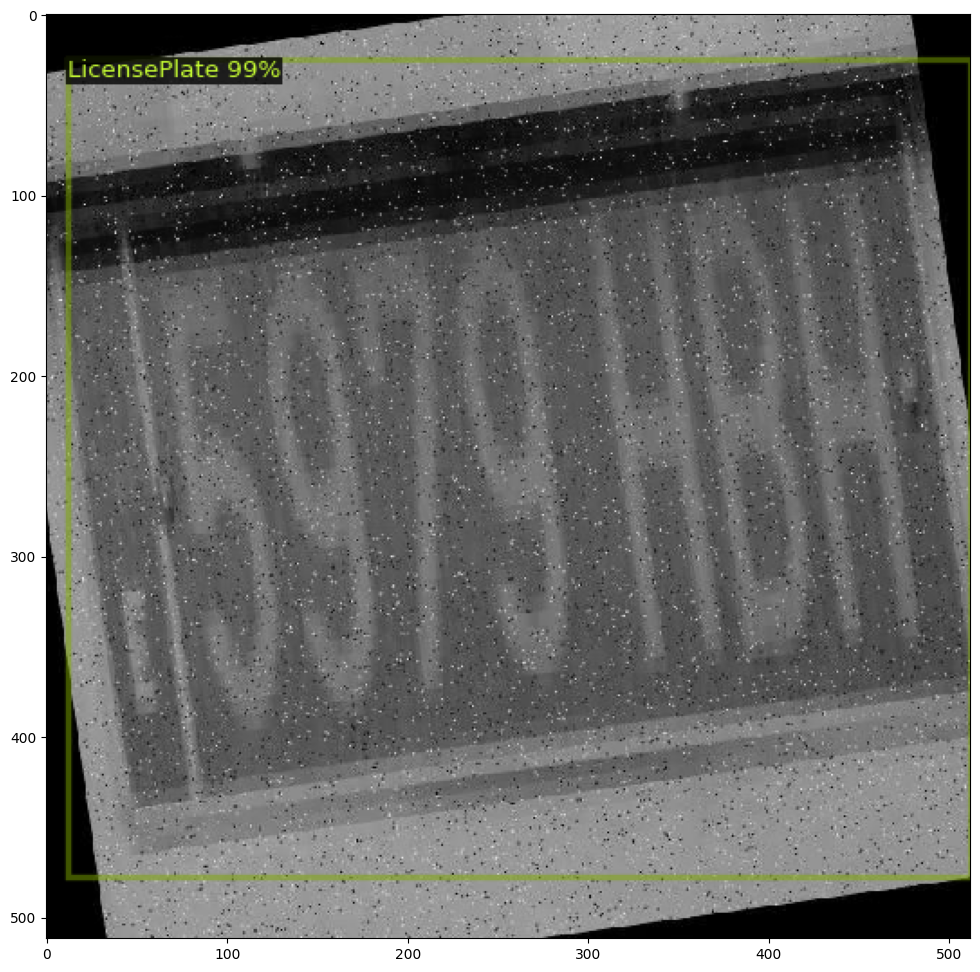

In [ ]:
import random
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer

# Ensure the dataset is loaded correctly
dataset_dicts = lp_test_dataset

# Iterate through a few sample test images
for d in random.sample(dataset_dicts, 3):
    # Load the image
    im = cv2.imread(d["file_name"])

    # Run the predictor on the image
    outputs = predictor(im)

    # Visualize the output
    v = Visualizer(im[:, :, ::-1],
                   metadata=lp_test_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Display the image
    plt.figure(figsize=(12, 12))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()
